# Cervical Cancer

In this tutorial, you will learn how generate and submit predictions to a Kaggle competiton

[Dogs vs. Cats Redux: Kernels Edition](https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition)
    
    

To start you will need to download and unzip the competition data from Kaggle and ensure your directory structure looks like this
```
utils/
    vgg16.py
    utils.py
cervical/
    cervical.ipynb
    data/
        train/
            cat.437.jpg
            dog.9924.jpg
            cat.1029.jpg
            dog.4374.jpg
        test/
            231.jpg
            325.jpg
            1235.jpg
            9923.jpg
```

You can download the data files from the competition page [here](https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/data) or you can download them from the command line using the [Kaggle CLI](https://github.com/floydwch/kaggle-cli).

You should launch your notebook inside the lesson1 directory
```
cd cervical
jupyter notebook
```

In [1]:
#Verify we are in the lesson1 directory
%pwd

u'/home/ubuntu/courses/deeplearning1/nbs/cervical'

In [2]:
#Create references to important directories we will use over and over
import os, sys
current_dir = os.getcwd()
LESSON_HOME_DIR = current_dir
DATA_HOME_DIR = current_dir+'/data/'

In [3]:
#Allow relative imports to directories above lesson1/

sys.path.insert(1, os.path.join(sys.path[0], '../'))

#import modules
from utils import *
from vgg16 import Vgg16

#Instantiate plotting tool
#In Jupyter notebooks, you will need to run this command before doing any plotting
%matplotlib inline

WARNING (theano.sandbox.cuda): The cuda backend is deprecated and will be removed in the next release (v0.10).  Please switch to the gpuarray backend. You can get more information about how to switch at this URL:
 https://github.com/Theano/Theano/wiki/Converting-to-the-new-gpu-back-end%28gpuarray%29

Using gpu device 0: Tesla K80 (CNMeM is disabled, cuDNN 5103)
Using Theano backend.


## Action Plan
1. Create Validation and Sample sets
2. Rearrange image files into their respective directories 
3. Finetune and Train model
4. Generate predictions
5. Validate predictions
6. Submit predictions to Kaggle

## Create validation set and sample

In [25]:
#Create directories
%cd $DATA_HOME_DIR
%mkdir valid
%mkdir results
%mkdir -p sample/train
%mkdir -p sample/test
%mkdir -p sample/valid
%mkdir -p sample/results
%mkdir -p test/unknown

[Errno 2] No such file or directory: '/home/ubuntu/courses/deeplearning1/nbs/cervical/data/data/'
/home/ubuntu/courses/deeplearning1/nbs/cervical/data
mkdir: cannot create directory ‘valid’: File exists
mkdir: cannot create directory ‘results’: File exists


In [6]:
%cd $DATA_HOME_DIR/train

/home/ubuntu/courses/deeplearning1/nbs/cervical/data/train


In [6]:
g = glob('Type*/*.jpg')
shuf = np.random.permutation(g)
for i in range(2000): os.rename(shuf[i], DATA_HOME_DIR+'/valid/' + shuf[i])

IndexError: index 0 is out of bounds for axis 0 with size 0

In [7]:
from shutil import copyfile

In [8]:
g = glob('*.jpg')
shuf = np.random.permutation(g)
for i in range(200): copyfile(shuf[i], DATA_HOME_DIR+'/sample/train/' + shuf[i])

In [9]:
%cd $DATA_HOME_DIR/valid

/home/ubuntu/courses/deeplearning1/nbs/lesson1/data/redux/valid


In [10]:
g = glob('*.jpg')
shuf = np.random.permutation(g)
for i in range(50): copyfile(shuf[i], DATA_HOME_DIR+'/sample/valid/' + shuf[i])

## Rearrange image files into their respective directories

In [9]:
#Divide cat/dog images into separate directories

%cd $DATA_HOME_DIR/sample/train
#%mkdir type1
#%mkdir type2
#%mkdir type3
#%mv cat.*.jpg cats/
#%mv dog.*.jpg dogs/

%cd $DATA_HOME_DIR/sample/valid
%mkdir type1
%mkdir type2
%mkdir type3
#%mv cat.*.jpg cats/
#%mv dog.*.jpg dogs/

%cd $DATA_HOME_DIR/valid
#%mkdir cats
#%mkdir dogs
%mkdir type1
%mkdir type2
%mkdir type3
#%mv cat.*.jpg cats/
#%mv dog.*.jpg dogs/

%cd $DATA_HOME_DIR/train
#%mkdir cats
#%mkdir dogs
#%mv cat.*.jpg cats/
#%mv dog.*.jpg dogs/

/home/ubuntu/courses/deeplearning1/nbs/cervical/data/sample/train
/home/ubuntu/courses/deeplearning1/nbs/cervical/data/sample/valid
/home/ubuntu/courses/deeplearning1/nbs/cervical/data/valid
/home/ubuntu/courses/deeplearning1/nbs/cervical/data/train


In [10]:
# Create single 'unknown' class for test set
%cd $DATA_HOME_DIR/test
#%mv *.jpg unknown/

/home/ubuntu/courses/deeplearning1/nbs/cervical/data/test


## Finetuning and Training

In [4]:
%cd $DATA_HOME_DIR

#Set path to sample/ path if desired
path = DATA_HOME_DIR + '/' #'/sample/'
test_path = DATA_HOME_DIR + '/test/' #We use all the test data
results_path=DATA_HOME_DIR + '/results/'
train_path=path + '/train/'
valid_path=path + '/valid/'

/home/ubuntu/courses/deeplearning1/nbs/cervical/data


In [5]:
#import Vgg16 helper class
vgg = Vgg16()

In [6]:
#Set constants. You can experiment with no_of_epochs to improve the model
batch_size=64
no_of_epochs=1

In [7]:
#Finetune the model
batches = vgg.get_batches(train_path, batch_size=batch_size)
val_batches = vgg.get_batches(valid_path, batch_size=batch_size)
vgg.finetune(batches)

#Not sure if we set this for all fits
vgg.model.optimizer.lr = 0.01

Found 1470 images belonging to 3 classes.
Found 352 images belonging to 3 classes.


In [8]:
#Notice we are passing in the validation dataset to the fit() method
#For each epoch we test our model against the validation set
latest_weights_filename = None
for epoch in range(no_of_epochs):
    print "Running epoch: %d" % epoch
    vgg.fit(batches, val_batches, nb_epoch=1)
    latest_weights_filename = 'ft%d.h5' % epoch
    vgg.model.save_weights(results_path+latest_weights_filename)
print "Completed %s fit operations" % no_of_epochs

Running epoch: 0
Epoch 1/1
1470/1470 [==============================] - 464s - loss: 7.1590 - acc: 0.5204 - val_loss: 10.6233 - val_acc: 0.3409


NameError: name 'epochenso' is not defined

## Generate Predictions

Let's use our new model to make predictions on the test dataset

In [9]:
latest_weights_filename = 'ft%d.h5' % epoch
vgg.model.save_weights(results_path+latest_weights_filename)
batches, preds = vgg.test(test_path, batch_size = batch_size*2)

Found 511 images belonging to 1 classes.


In [10]:
#For every image, vgg.test() generates two probabilities 
#based on how we've ordered the cats/dogs directories.
#It looks like column one is cats and column two is dogs
print preds[:5]
filenames = batches.filenames
print filenames[:5]

[[  0.0000e+00   1.0000e+00   0.0000e+00]
 [  0.0000e+00   1.0000e+00   3.2650e-43]
 [  0.0000e+00   1.0000e+00   9.1517e-39]
 [  0.0000e+00   1.0000e+00   0.0000e+00]
 [  0.0000e+00   1.0000e+00   0.0000e+00]]
['unknown/400.jpg', 'unknown/430.jpg', 'unknown/303.jpg', 'unknown/126.jpg', 'unknown/487.jpg']


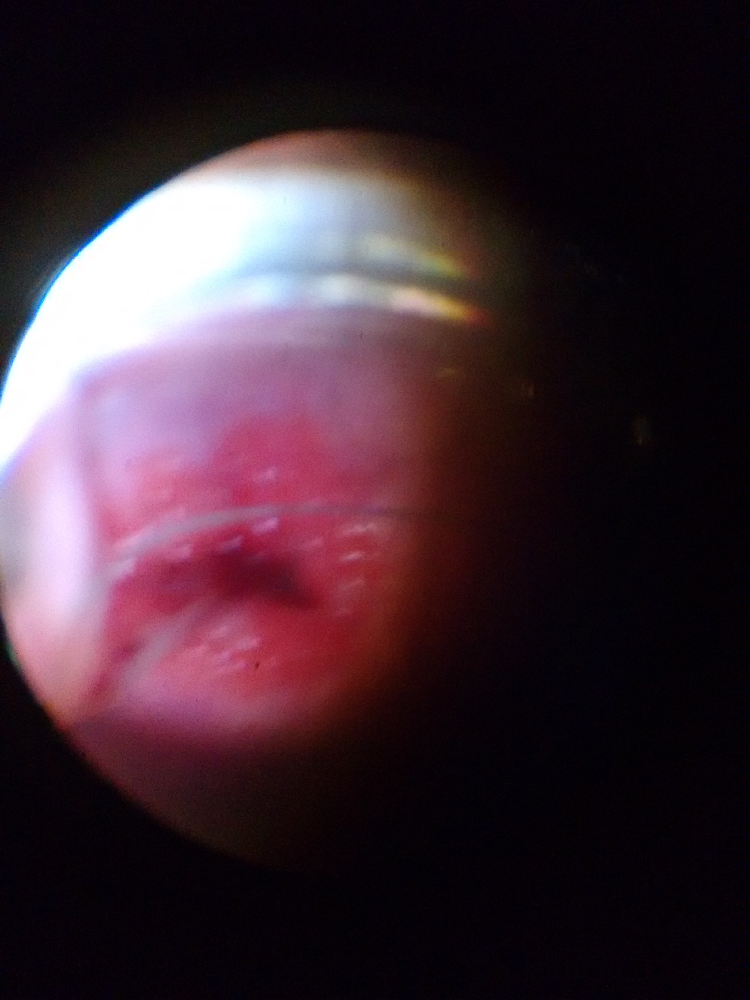

In [11]:
#You can verify the column ordering by viewing some images
from PIL import Image
Image.open(test_path + filenames[2])

In [12]:
#Save our test results arrays so we can use them again later
save_array(results_path + 'test_preds.dat', preds)
save_array(results_path + 'filenames.dat', filenames)

## Validate Predictions

Keras' *fit()* function conveniently shows us the value of the loss function, and the accuracy, after every epoch ("*epoch*" refers to one full run through all training examples). The most important metrics for us to look at are for the validation set, since we want to check for over-fitting. 

- **Tip**: with our first model we should try to overfit before we start worrying about how to reduce over-fitting - there's no point even thinking about regularization, data augmentation, etc if you're still under-fitting! (We'll be looking at these techniques shortly).

As well as looking at the overall metrics, it's also a good idea to look at examples of each of:
1. A few correct labels at random
2. A few incorrect labels at random
3. The most correct labels of each class (ie those with highest probability that are correct)
4. The most incorrect labels of each class (ie those with highest probability that are incorrect)
5. The most uncertain labels (ie those with probability closest to 0.5).

Let's see what we can learn from these examples. (In general, this is a particularly useful technique for debugging problems in the model. However, since this model is so simple, there may not be too much to learn at this stage.)

Calculate predictions on validation set, so we can find correct and incorrect examples:

In [13]:
vgg.model.load_weights(results_path+latest_weights_filename)

In [14]:
val_batches, probs = vgg.test(valid_path, batch_size = batch_size)

Found 352 images belonging to 3 classes.


In [15]:
filenames = val_batches.filenames
expected_labels = val_batches.classes #0 or 1

#Round our predictions to 0/1 to generate labels
our_predictions = probs[:,0]
our_labels = np.round(1-our_predictions)

In [16]:
from keras.preprocessing import image

#Helper function to plot images by index in the validation set 
#Plots is a helper function in utils.py
def plots_idx(idx, titles=None):
    plots([image.load_img(valid_path + filenames[i]) for i in idx], titles=titles)
    
#Number of images to view for each visualization task
n_view = 4

Found 120 correct labels


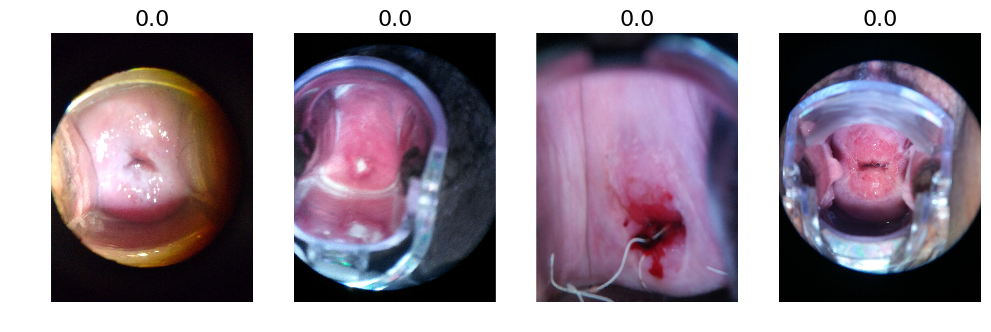

In [17]:
#1. A few correct labels at random
correct = np.where(our_labels==expected_labels)[0]
print "Found %d correct labels" % len(correct)
idx = permutation(correct)[:n_view]
plots_idx(idx, our_predictions[idx])

Found 232 incorrect labels


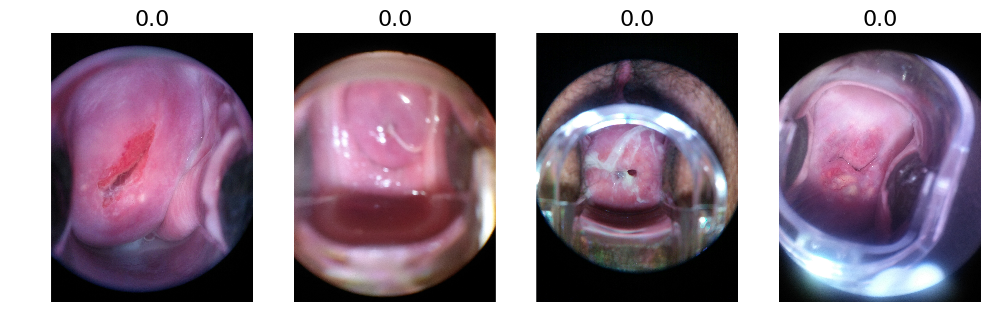

In [18]:
#2. A few incorrect labels at random
incorrect = np.where(our_labels!=expected_labels)[0]
print "Found %d incorrect labels" % len(incorrect)
idx = permutation(incorrect)[:n_view]
plots_idx(idx, our_predictions[idx])

In [19]:
#3a. The images we most confident were cats, and are actually cats
correct_cats = np.where((our_labels==0) & (our_labels==expected_labels))[0]
print "Found %d confident correct cats labels" % len(correct_cats)
most_correct_cats = np.argsort(our_predictions[correct_cats])[::-1][:n_view]
plots_idx(correct_cats[most_correct_cats], our_predictions[correct_cats][most_correct_cats])

Found 0 confident correct cats labels


IndexError: list index out of range

Found 120 confident correct dogs labels


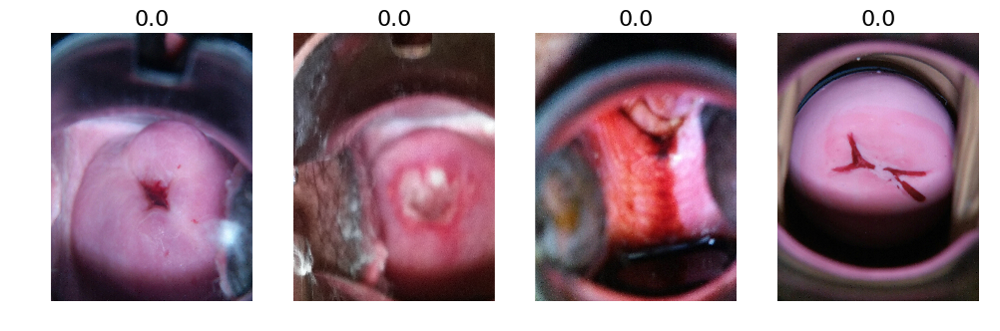

In [20]:
#3b. The images we most confident were dogs, and are actually dogs
correct_dogs = np.where((our_labels==1) & (our_labels==expected_labels))[0]
print "Found %d confident correct dogs labels" % len(correct_dogs)
most_correct_dogs = np.argsort(our_predictions[correct_dogs])[:n_view]
plots_idx(correct_dogs[most_correct_dogs], our_predictions[correct_dogs][most_correct_dogs])

In [22]:
#4a. The images we were most confident were cats, but are actually dogs
incorrect_cats = np.where((our_labels==0) & (our_labels!=expected_labels))[0]
print "Found %d incorrect cats" % len(incorrect_cats)
if len(incorrect_cats):
    most_incorrect_cats = np.argsort(our_predictions[incorrect_cats])[::-1][:n_view]
    plots_idx(incorrect_cats[most_incorrect_cats], our_predictions[incorrect_cats][most_incorrect_cats])

Found 0 incorrect cats


Found 21 incorrect dogs


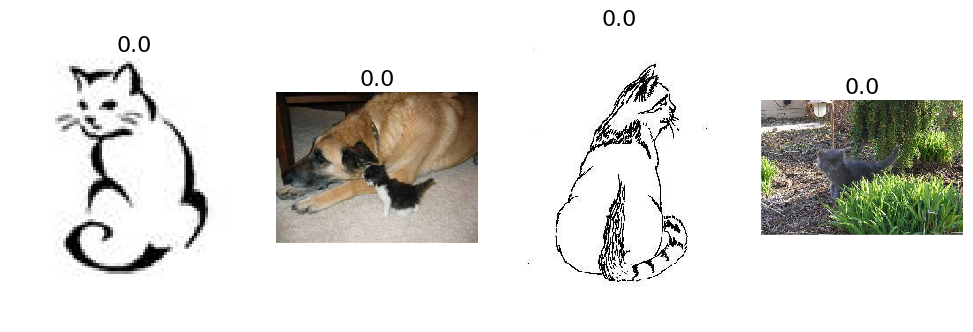

In [37]:
#4b. The images we were most confident were dogs, but are actually cats
incorrect_dogs = np.where((our_labels==1) & (our_labels!=expected_labels))[0]
print "Found %d incorrect dogs" % len(incorrect_dogs)
if len(incorrect_dogs):
    most_incorrect_dogs = np.argsort(our_predictions[incorrect_dogs])[:n_view]
    plots_idx(incorrect_dogs[most_incorrect_dogs], our_predictions[incorrect_dogs][most_incorrect_dogs])

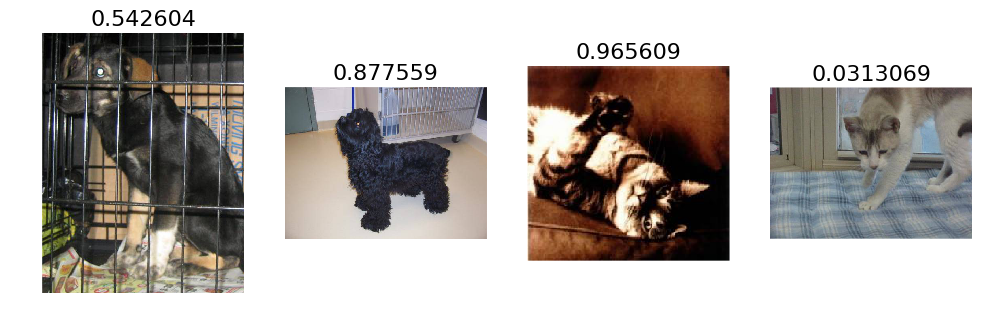

In [38]:
#5. The most uncertain labels (ie those with probability closest to 0.5).
most_uncertain = np.argsort(np.abs(our_predictions-0.5))
plots_idx(most_uncertain[:n_view], our_predictions[most_uncertain])

Perhaps the most common way to analyze the result of a classification model is to use a [confusion matrix](http://www.dataschool.io/simple-guide-to-confusion-matrix-terminology/). Scikit-learn has a convenient function we can use for this purpose:

In [23]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(expected_labels, our_labels)

We can just print out the confusion matrix, or we can show a graphical view (which is mainly useful for dependents with a larger number of categories).

[[  0  90   0]
 [  0 120   0]
 [  0 142   0]]


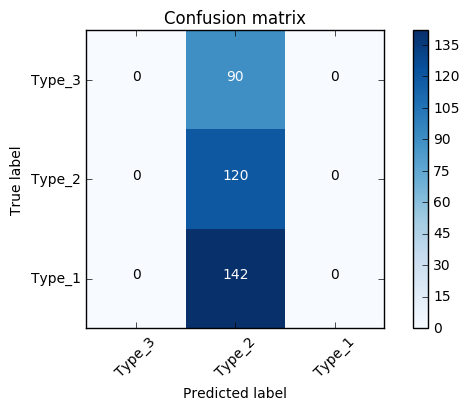

In [24]:
plot_confusion_matrix(cm, val_batches.class_indices)

## Submit Predictions to Kaggle!

Here's the format Kaggle requires for new submissions:
```
imageId,isDog
1242, .3984
3947, .1000
4539, .9082
2345, .0000
```

Kaggle wants the imageId followed by the probability of the image being a dog. Kaggle uses a metric called [Log Loss](http://wiki.fast.ai/index.php/Log_Loss) to evaluate your submission.

In [25]:
#Load our test predictions from file
preds = load_array(results_path + 'test_preds.dat')
filenames = load_array(results_path + 'filenames.dat')

In [42]:
#Grab the dog prediction column
isdog = preds[:,1]
print "Raw Predictions: " + str(isdog[:5])
print "Mid Predictions: " + str(isdog[(isdog < .6) & (isdog > .4)])
print "Edge Predictions: " + str(isdog[(isdog == 1) | (isdog == 0)])

Raw Predictions: [  0.0000e+00   6.9378e-30   0.0000e+00   0.0000e+00   1.0000e+00]
Mid Predictions: [ 0.4719  0.4392  0.4634  0.4796]
Edge Predictions: [ 0.  0.  0. ...,  0.  0.  1.]


[Log Loss](http://wiki.fast.ai/index.php/Log_Loss) doesn't support probability values of 0 or 1--they are undefined (and we have many). Fortunately, Kaggle helps us by offsetting our 0s and 1s by a very small value. So if we upload our submission now we will have lots of .99999999 and .000000001 values. This seems good, right?

Not so. There is an additional twist due to how log loss is calculated--log loss rewards predictions that are confident and correct (p=.9999,label=1), but it punishes predictions that are confident and wrong far more (p=.0001,label=1). See visualization below.

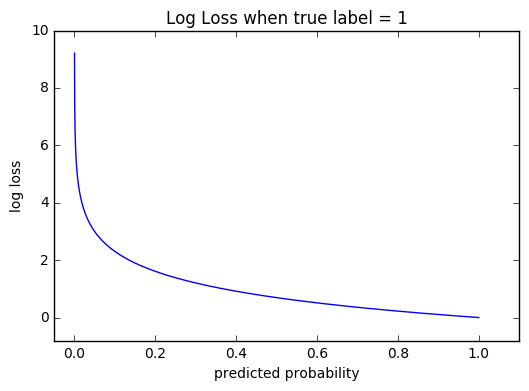

In [43]:
#Visualize Log Loss when True value = 1
#y-axis is log loss, x-axis is probabilty that label = 1
#As you can see Log Loss increases rapidly as we approach 0
#But increases slowly as our predicted probability gets closer to 1
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import log_loss

x = [i*.0001 for i in range(1,10000)]
y = [log_loss([1],[[i*.0001,1-(i*.0001)]],eps=1e-15) for i in range(1,10000,1)]

plt.plot(x, y)
plt.axis([-.05, 1.1, -.8, 10])
plt.title("Log Loss when true label = 1")
plt.xlabel("predicted probability")
plt.ylabel("log loss")

plt.show()

In [45]:
#So to play it safe, we use a sneaky trick to round down our edge predictions
#Swap all ones with .95 and all zeros with .05
isdog = isdog.clip(min=0.025, max=0.975)

In [26]:
#Extract imageIds from the filenames in our test/unknown directory 
filenames = batches.filenames
ids = np.array([int(f[8:f.find('.')]) for f in filenames])
print ids

[400 430 303 126 487  18 248 502 383 478 246 355 222 433 354 154  32 490 210 387 183 280  74 484 145
 399 156  85 351 233 268 190 416 103 230  27 112 330 128 342 398 255 243 471  41 168 122 499 444 111
  42  79 328 345  94 216  47 404 472  17 451 373 337 192  23  71 147 408 312 509 205 227 305 366  24
 376 166 371 356 221 448 148 223 314 297  22 465 479  14 482 362 333 397 127 417 343 467  90 442 492
 291  11 209 257  67 510 403 281  38 201 207  56 346 454 425   5 506 380  55 114  39 231 256  88  65
 452 163 386 172 273 177 137  61 228  81  40 401  62  25 270 179 476 367 453 511 278   3 412 327 505
 335 141 493  58 317   0 272  31 319 485 370   6 394 271 423 113 232  86 375 495   2 293 494 298  91
 106 244 212 419 108  53 460 504  76 315 153 194 200 445 332 338 100  96 287 260 318 302 277 133 361
  92  89 392 382 110 481 352 120 296 119  28 498 288 198  60 304 182 229 125 202 390 306 396 263  16
 347 427 289 109 415 143 359 282 350 391 372 473   4  75 290 247 203 134  51 336 500  69 36

Here we join the two columns into an array of [imageId, isDog]

In [41]:
print preds
print len(preds),
print len(preds[0])
print len(ids)
subm2 = np.column_stack([ids,preds])
subm2[:5]

[[  0.0000e+00   1.0000e+00   0.0000e+00]
 [  0.0000e+00   1.0000e+00   3.2650e-43]
 [  0.0000e+00   1.0000e+00   9.1517e-39]
 ..., 
 [  0.0000e+00   1.0000e+00   4.1198e-43]
 [  0.0000e+00   1.0000e+00   2.2311e-38]
 [  0.0000e+00   1.0000e+00   1.5317e-37]]
511 3
511


array([[  4.0000e+02,   0.0000e+00,   1.0000e+00,   0.0000e+00],
       [  4.3000e+02,   0.0000e+00,   1.0000e+00,   3.2650e-43],
       [  3.0300e+02,   0.0000e+00,   1.0000e+00,   9.1517e-39],
       [  1.2600e+02,   0.0000e+00,   1.0000e+00,   0.0000e+00],
       [  4.8700e+02,   0.0000e+00,   1.0000e+00,   0.0000e+00]])

In [46]:
submission_file_name = 'submission1.csv'
np.savetxt(submission_file_name, subm2, fmt='%d,%.5f,%.5f,%.5f', comments='')

In [47]:
from IPython.display import FileLink
#%cd $LESSON_HOME_DIR
FileLink(submission_file_name)

/home/ubuntu/courses/deeplearning1/nbs/cervical/data/submission1.csv

You can download this file and submit on the Kaggle website or use the Kaggle command line tool's "submit" method.